## MA5852 Assessment 2 - Cloud Computing
### Notebook 2 - Baseline model training, tuning and performance assessment

#### Part 0: Notebook preparation

In [1]:
%%sh
ls -l

#%%sh
#sudo chown ec2-user lost+found

#%%sh
#sudo chgrp ec2-user lost+found

#%%sh
#ls -l 

total 11748
-rw-rw-r-- 1 ec2-user ec2-user     5157 May 30 07:16 A2_baseline ANN model script.py
-rw-rw-r-- 1 ec2-user ec2-user    85588 May 30 07:12 A2 Notebook 1.ipynb
-rw-rw-r-- 1 ec2-user ec2-user 11912632 May 31 01:00 A2 Notebook 2.ipynb
drwxrwxr-x 3 ec2-user ec2-user     4096 May 28 11:55 data
drwx------ 2 ec2-user ec2-user    16384 May 28 07:20 lost+found


In [2]:
# import necessary libraries
import boto3
import itertools
import matplotlib.pyplot as plt
import numpy as np
import sagemaker
import tensorflow as tf
import time

from sagemaker.analytics import HyperparameterTuningJobAnalytics
from sagemaker.tensorflow import (
    TensorFlow,
    TensorFlowModel,
    TensorFlowPredictor)
from sagemaker.tuner import (
    CategoricalParameter,
    ContinuousParameter,
    IntegerParameter,
    HyperparameterTuner)

from sklearn.metrics import (
    accuracy_score,
    auc,
    balanced_accuracy_score,
    confusion_matrix,
    f1_score,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score)

In [3]:
# define environment variables
sess = sagemaker.Session()
role = sagemaker.get_execution_role()
bucket = sess.default_bucket()
prefix = "A2"
tensorflow_logs_path = "s3://{}/{}/logs".format(bucket, prefix)
training_input_path = "s3://{}/{}/training/training.npz".format(bucket, prefix)
validation_input_path = "s3://{}/{}/validation/validation.npz".format(bucket, prefix)
output_path = "s3://{}/{}/output".format(bucket, prefix)

print("SageMaker ver: " + sagemaker.__version__)
print("Tensorflow ver: " + tf.__version__)

SageMaker ver: 2.42.0
Tensorflow ver: 1.15.5


#### Part 1: Local mode

In [4]:
# set environment variables - file paths to data and for output
local_training_input_path = 'file://data/A2/training.npz'
local_validation_input_path = 'file://data/A2/validation.npz'
output = 'file:///tmp'

tf_estimator = TensorFlow(
    entry_point = 'A2_baseline ANN model script.py',
    role = role,
    source_dir = '.',
    instance_count = 1,
    instance_type = 'local',
    framework_version = '2.1.0',
    py_version = 'py3',
    script_mode = True,
    hyperparameters = {'epochs': 1},
    output_path = output)

print(tf_estimator.hyperparameters())

{'epochs': '1', 'model_dir': 'null'}


In [6]:
# test the python script is working
inputs = {'training': local_training_input_path,
          'validation': local_validation_input_path}

tf_estimator.fit(inputs)

Creating gcoukdjjwo-algo-1-bgje3 ... 
Creating gcoukdjjwo-algo-1-bgje3 ... done
Attaching to gcoukdjjwo-algo-1-bgje3
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,018 sagemaker-containers INFO     Imported framework sagemaker_tensorflow_container.training
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,025 sagemaker-containers INFO     No GPUs detected (normal if no gpus installed)
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,929 sagemaker-containers INFO     No GPUs detected (normal if no gpus installed)
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,948 sagemaker-containers INFO     No GPUs detected (normal if no gpus installed)
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,968 sagemaker-containers INFO     No GPUs detected (normal if no gpus installed)
gcoukdjjwo-algo-1-bgje3 | 2021-05-30 07:16:47,981 sagemaker-containers INFO     Invoking user script
gcoukdjjwo-algo-1-bgje3 | 
gcoukdjjwo-algo-1-bgje3 | Training Env:
gcoukdjjwo-algo-1-bgje3 | 
gcoukdjjwo-algo-1-bgje3 | {
gcoukdjjwo-al

gcoukdjjwo-algo-1-bgje3 | Collecting keras-metrics
gcoukdjjwo-algo-1-bgje3 |   Downloading keras_metrics-1.1.0-py2.py3-none-any.whl (5.6 kB)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: Keras>=2.1.5 in /usr/local/lib/python3.6/dist-packages (from keras-metrics) (2.3.1)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: pyyaml in /usr/local/lib/python3.6/dist-packages (from Keras>=2.1.5->keras-metrics) (5.3.1)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: h5py in /usr/local/lib/python3.6/dist-packages (from Keras>=2.1.5->keras-metrics) (2.10.0)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: numpy>=1.9.1 in /usr/local/lib/python3.6/dist-packages (from Keras>=2.1.5->keras-metrics) (1.18.1)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: six>=1.9.0 in /usr/local/lib/python3.6/dist-packages (from Keras>=2.1.5->keras-metrics) (1.14.0)
gcoukdjjwo-algo-1-bgje3 | Requirement already satisfied: scipy>=0.14 in /usr/local/lib/python3.6/dist-packages 

#### Part 2: Sagemaker training and tuning

In [5]:
# reminder of the relevant S3 paths
print("Bucket: {}".format(bucket))
print("Tensorflow logs path: " + tensorflow_logs_path)
print("Training data location: " + training_input_path)
print("Validation data location: " + validation_input_path)
print("Output path: " + output_path)

Bucket: sagemaker-ap-southeast-2-987959606453
Tensorflow logs path: s3://sagemaker-ap-southeast-2-987959606453/A2/logs
Training data location: s3://sagemaker-ap-southeast-2-987959606453/A2/training/training.npz
Validation data location: s3://sagemaker-ap-southeast-2-987959606453/A2/validation/validation.npz
Output path: s3://sagemaker-ap-southeast-2-987959606453/A2/output


In [6]:
# configure the estimator
tf_estimator = TensorFlow(
    entry_point = 'A2_baseline ANN model script.py',
    role = role,
    source_dir = '.',
    instance_count = 1,
    instance_type = 'ml.m4.xlarge',
    framework_version = '2.1.0',
    py_version = 'py3',
    script_mode = True,
    output_path = output_path)

# and give it a name
training_job_name = 'A2-baseline-training-job-'+ time.strftime("%Y-%m-%d-%H-%M-%S", time.gmtime())

In [13]:
# fit the model in SageMaker
inputs = {'training': training_input_path,
          'validation': validation_input_path}

tf_estimator.fit(inputs, job_name=training_job_name)

2021-05-30 07:32:03 Starting - Starting the training job...
2021-05-30 07:32:27 Starting - Launching requested ML instancesProfilerReport-1622359913: InProgress
......
2021-05-30 07:33:29 Starting - Preparing the instances for training.........
2021-05-30 07:34:54 Downloading - Downloading input data...
2021-05-30 07:35:28 Training - Downloading the training image........2021-05-30 07:36:41,919 sagemaker-containers INFO     Imported framework sagemaker_tensorflow_container.training
2021-05-30 07:36:43,086 sagemaker-containers INFO     Invoking user script

Training Env:

{
    "additional_framework_parameters": {},
    "channel_input_dirs": {
        "training": "/opt/ml/input/data/training",
        "validation": "/opt/ml/input/data/validation"
    },
    "current_host": "algo-1",
    "framework_module": "sagemaker_tensorflow_container.training:main",
    "hosts": [
        "algo-1"
    ],
    "hyperparameters": {
        "model_dir": "s3://sagemaker-ap-southeast-2-987959606453/A2/out


2021-05-30 07:36:48 Training - Training image download completed. Training in progress.Train on 47638 samples, validate on 10208 samples
[2021-05-30 07:36:50.069 ip-10-0-195-117.ap-southeast-2.compute.internal:24 INFO keras.py:68] Executing in TF2.x eager mode.TF 2.x eager doesn't provide gradient and optimizer variable values.SageMaker Debugger will not be saving gradients and optimizer variables in this case
Epoch 1/50
[2021-05-30 07:36:50.085 ip-10-0-195-117.ap-southeast-2.compute.internal:24 INFO hook.py:364] Monitoring the collections: losses, metrics, sm_metrics
ERROR:root:'NoneType' object has no attribute 'write'
#015   32/47638 [..............................] - ETA: 1:00:57 - loss: 0.7797 - tn: 10.0000 - fn: 5.0000 - tp: 5.0000 - fp: 12.0000 - accuracy: 0.4688 - precision: 0.2941 - recall: 0.5000 - auc: 0.3955 - loss_1: 0.7797 - prc: 0.2450#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01534496/47638 [====================>.........] - ETA: 3s - loss: 0.6628 - tn: 18280.0000 - fn: 11837.0000 - tp: 2280.0000 - fp: 2099.0000 - accuracy: 0.5960 - precision: 0.5207 - recall: 0.1615 - auc: 0.5953 - loss_1: 0.6628 - prc: 0.4813#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

========>..................] - ETA: 7s - loss: 0.6458 - tn: 10485.0000 - fn: 6090.0000 - tp: 2347.0000 - fp: 1718.0000 - accuracy: 0.6217 - precision: 0.5774 - recall: 0.2782 - auc: 0.6404 - loss_1: 0.6458 - prc: 0.5379#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

.0000 - accuracy: 0.6351 - precision: 0.5931 - recall: 0.3414 - auc: 0.6584 - loss_1: 0.6380 - prc: 0.5596#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543616/47638 [==========================>...] - ETA: 0s - loss: 0.6402 - tn: 21561.0000 - fn: 12029.0000 - tp: 5839.0000 - fp: 4187.0000 - accuracy: 0.6282 - precision: 0.58

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543616/47638 [==========================>...] - ETA: 0s - loss: 0.6385 - tn: 21752.0000 - fn: 12081.0000 - tp: 5821.0000 - fp: 3962.0000 - accuracy: 0.6322 -

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543168/47638 [==========================>...] - ETA: 0s - loss: 0.6366 - tn: 21342.0000 - fn: 11760.0000 - tp: 5952.0000 - fp: 4114.0000 - accuracy: 0.6323 - precision: 0.5913 - recall: 0.3360 - auc: 0.6600 - loss_1: 0.6366 - prc: 0.

fp: 1714.0000 - accuracy: 0.6344 - precision: 0.5986 - recall: 0.3547 - auc: 0.6662 - loss_1: 0.6346 - prc: 0.5794#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

5 - precision: 0.6040 - recall: 0.3486 - auc: 0.6670 - loss_1: 0.6368 - prc: 0.5758#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#015   32/47638 [..............................] - ETA: 21s - loss: 0.6541 - tn: 17.0000 - fn: 9.0000 - tp: 3.0000 - fp: 3.0000 - accuracy: 0.6250 - precision: 0.5000 - recall: 0.2500 - auc: 0.5688 - loss_1: 0.6541 - prc: 0.5102#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#015   32/47638 [..............................] - ETA: 20s - loss: 0.6001 - tn: 15.0000 - fn: 8.0000 - tp: 7.0000 - fp: 2.0000 - accuracy: 0.6875 - precision: 0.7778 - recall: 0.4667 - auc: 0.7569 - loss_1: 0.6001 - prc: 0.7831#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#015   32/47638 [..............................] - ETA: 21s - loss: 0.5576 - tn: 20.0000 - fn: 4.0000 - tp: 3.0000 - fp: 5.0000 - accuracy: 0.7188 - precision: 0.3750 - recall: 0.4286 - auc: 0.7229 - loss_1: 0.5576 - prc: 0.4314#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

loss: 0.6309 - tn: 12770.0000 - fn: 6926.0000 - tp: 3504.0000 - fp: 2336.0000 - accuracy: 0.6373 - precision: 0.6000 - recall: 0.3360 - auc: 0.6696 - loss_1: 0.6309 - prc: 0.5750#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

 accuracy: 0.6353 - precision: 0.5993 - recall: 0.3537 - auc: 0.6720 - loss_1: 0.6317 - prc: 0.5819#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

 - fp: 1598.0000 - accuracy: 0.6406 - precision: 0.6051 - recall: 0.3508 - auc: 0.6767 - loss_1: 0.6274 - prc: 0.5821#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01542880/47638 [==========================>...] - ETA: 1s - loss: 0.6311 - tn: 21234.0000 - fn: 11496.0000 - tp: 6061.0000 - fp: 4089.0000 - accuracy: 0.6365 - precision: 0.5971 - recall:

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543680/47638 [==========================>...] - ETA: 0s - loss: 0.6299 - tn: 21673.0000 - fn: 11694.0000 - tp: 6194.0000 - fp: 4119.0000 - accuracy: 0.6380 - precision: 0.6006 - recall: 0.3463 - auc: 0.6718 - loss_1: 0.6299 -

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543168/47638 [==========================>...] - ETA: 0s - loss: 0.6307 - tn: 21337.0000 - fn: 11521.0000 - tp: 6172.0000 - fp: 4138.0000 - accuracy: 0.6373 - precision: 0.5986 - recall: 0.3488 - auc: 0.6709 - loss_1: 0.6307 - prc: 0.5777#010#010#010#010#010#010#010#010#010#010#010#010

ccuracy: 0.6385 - precision: 0.6031 - recall: 0.3561 - auc: 0.6742 - loss_1: 0.6292 - prc: 0.5855#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

p: 1633.0000 - accuracy: 0.6378 - precision: 0.6011 - recall: 0.3658 - auc: 0.6738 - loss_1: 0.6304 - prc: 0.5814#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

: 0.6516 - precision: 0.6161 - recall: 0.3624 - auc: 0.6836 - loss_1: 0.6219 - prc: 0.5864#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

#015   32/47638 [..............................] - ETA: 37s - loss: 0.6279 - tn: 17.0000 - fn: 9.0000 - tp: 3.0000 - fp: 3.0000 - accuracy: 0.6250 - precision: 0.5000 - recall: 0.2500 - auc: 0.7021 - loss_1: 0.6279 - prc: 0.4797#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543808/47638 [==========================>...] - ETA: 0s - loss: 0.6291 - tn: 21608.0000 - fn: 11602.0000 - tp: 6392.0000 - fp: 4206.0000 - accuracy: 0.6392 - precision: 0.6031 - recall: 0.3552 - auc: 0.6740 - loss_1: 0.6291 -

0 - accuracy: 0.6455 - precision: 0.6082 - recall: 0.3582 - auc: 0.6744 - loss_1: 0.6276 - prc: 0.5802#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

73.0000 - accuracy: 0.6376 - precision: 0.6076 - recall: 0.3597 - auc: 0.6738 - loss_1: 0.6307 - prc: 0.5883#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

0 - fn: 3641.0000 - tp: 1992.0000 - fp: 1305.0000 - accuracy: 0.6389 - precision: 0.6042 - recall: 0.3536 - auc: 0.6785 - loss_1: 0.6267 - prc: 0.5858#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539872/47638 [========================>.....] - ETA: 1s - loss: 0.6291 - tn: 19660.0000 - fn: 10549.0000 - tp: 5847.0000 - fp: 3816.0000 - accuracy: 0.6397 - precision: 0.6051 - recall: 0.3566 - auc: 0.6747 - loss_1: 0.6291 - prc: 0.5833#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543552/47638 [==========================>...] - ETA: 0s - loss: 0.6279 - tn: 21564.0000 - fn: 11441.0000 - tp: 6405.0000 - fp: 4142.0000 - accuracy: 0.6422 - precision: 0.6073 - recall: 0.3589 - auc: 0.6764 - loss_1: 

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01544096/47638 [==========================>...] - ETA: 0s - loss: 0.6284 - tn: 21847.0000 - fn: 11696.0000 - tp: 6390.0000 - fp: 4163.0000 - accuracy: 0.6404 - precision: 0.6055 - rec

000 - accuracy: 0.6365 - precision: 0.5991 - recall: 0.3524 - auc: 0.6745 - loss_1: 0.6285 - prc: 0.5837#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

curacy: 0.6369 - precision: 0.5968 - recall: 0.3564 - auc: 0.6731 - loss_1: 0.6299 - prc: 0.5801#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

: 3801.0000 - tp: 2163.0000 - fp: 1382.0000 - accuracy: 0.6471 - precision: 0.6102 - recall: 0.3627 - auc: 0.6831 - loss_1: 0.6229 - prc: 0.5901#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01540832/47638 [========================>.....] - ETA: 1s - loss: 0.6266 - tn: 20062.0000 - fn: 10574.0000 - tp: 6165.0000 - fp: 4031.0000 - accuracy: 0.6423 - precision: 0.6046 - recall: 0.3683 - auc: 0.6782 - loss_1: 0.6266 - prc: 0.5866#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543072/47638 [==========================>...] - ETA: 0s - loss: 0.6274 - tn: 21230.0000 - fn: 11389.0000 - tp: 6307.0000 - fp: 4146.0000 - accuracy: 0.6393 - precision: 0.6034 - recall: 0.3564 - auc: 0.6773 - loss_1: 0.6274 - prc: 0.5853#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543808/47638 [==========================>...] - ETA: 0s - loss: 0.6281 - tn: 21608.0000 - fn: 11525.0000 - tp: 6457.0000 - fp: 4218.0000 - accuracy: 0.6406 - precision: 0.6049 - recall: 0.3591 - auc: 0.6760 - loss_1: 0.62

.0000 - accuracy: 0.6424 - precision: 0.6071 - recall: 0.3682 - auc: 0.6810 - loss_1: 0.6261 - prc: 0.5876#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

- accuracy: 0.6437 - precision: 0.6097 - recall: 0.3618 - auc: 0.6795 - loss_1: 0.6256 - prc: 0.5907#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01542848/47638 [=========================>....] - ETA: 1s - loss: 0.6264 - tn: 21146.0000 - fn: 11161.0000 - tp: 6422.0000 - fp: 4119.0000 - accuracy: 0.6434 - precision: 0.6092 - recall: 0.3652 - auc: 0.6790 - loss_1: 0.6264 - prc: 0.5881#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543392/47638 [==========================>...] - ETA: 0s - loss: 0.6274 - tn: 21460.0000 - fn: 11405.0000 - tp: 6369.0000 - fp: 4158.0000 - accuracy: 0.6413 - precision: 0.6050 - recall: 0.3583 - auc: 0.6765 - loss_1: 0.6274 - prc: 0.5841#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543136/47638 [==========================>...] - ETA: 0s - loss: 0.6269 - tn: 21378.0000 - fn: 11359.0000 - tp: 6317.0000 - fp: 4082.0000 - accuracy: 0.6420 - precision: 0.6075 - recall: 0.3574 - auc: 0.6779 - loss_1: 0.6269 - prc: 0.5864#010#010#010#010

 1815.0000 - accuracy: 0.6410 - precision: 0.6023 - recall: 0.3870 - auc: 0.6793 - loss_1: 0.6266 - prc: 0.5910#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

1523.0000 - accuracy: 0.6411 - precision: 0.6037 - recall: 0.3457 - auc: 0.6757 - loss_1: 0.6267 - prc: 0.5835#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539968/47638 [========================>.....] - ETA: 1s - loss: 0.6270 - tn: 19804.0000 - fn: 10595.0000 - tp: 5782.0000 - fp: 3787.0000 - accuracy: 0.6402 - precision: 0.6042 - recall: 0.3531 - auc: 0.6773 - loss_1: 0.6270 - prc: 0.5858#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539136/47638 [=======================>......] - ETA: 2s - loss: 0.6250 - tn: 19296.0000 - fn: 10154.0000 - tp: 5890.0000 - fp: 3796.0000 - accuracy: 0.6436 - precision: 0.6081 - recall: 0.3671 - auc: 0.6809 - loss_1: 0.6250 - prc: 0.5897#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01534944/47638 [=====================>........] - ETA: 2s - loss: 0.6253 - tn: 17397.0000 - fn: 9142.0000 - tp: 5091.0000 - fp: 3314.0000 - accuracy: 0.6435 - precision: 0.6057 - recall: 0.3577 - auc: 0.6788 - loss_1: 0.6253 - prc: 0.5865#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

.........] - ETA: 4s - loss: 0.6256 - tn: 12333.0000 - fn: 6377.0000 - tp: 4112.0000 - fp: 2746.0000 - accuracy: 0.6432 - precision: 0.5996 - recall: 0.3920 - auc: 0.6801 - loss_1: 0.6256 - prc: 0.5897#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

- loss: 0.6211 - tn: 12836.0000 - fn: 6639.0000 - tp: 3947.0000 - fp: 2562.0000 - accuracy: 0.6459 - precision: 0.6064 - recall: 0.3729 - auc: 0.6851 - loss_1: 0.6211 - prc: 0.5937#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#015   32/47638 [..............................] - ETA: 23s - loss: 0.6057 - tn: 13.0000 - fn: 10.0000 - tp: 6.0000 - fp: 3.0000 - accuracy: 0.5938 - precision: 0.6667 - recall: 0.3750 - auc: 0.7734 - loss_1: 0.6057 - prc: 0.7623#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01543072/47638 [==========================>...] - ETA: 0s - loss: 0.6264 - tn: 21196.0000 - fn: 11246.0000 - tp: 6398.0000 - fp: 4232.0000 - accuracy: 0.6406 - precision: 0.6019 - recall: 0.3626 - auc: 0.6784 - loss_1: 0.6264 - prc

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01538976/47638 [=======================>......] - ETA: 2s - loss: 0.6248 - tn: 18223.0000 - fn: 9090.0000 - tp: 6907.0000 - fp: 4756.0000 - accuracy: 0.6448 - precision: 0.5922 - recall: 0.4318 - auc: 0.6823 - loss_1: 0.6248 - prc: 0.5915#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01534816/47638 [====================>.........] - ETA: 2s - loss: 0.6251 - tn: 16775.0000 - fn: 8577.0000 - tp: 5648.0000 - fp: 3816.0000 - accuracy: 0.6440 - precision: 0.5968 - recall: 0.3970 - auc: 0.6808 - loss_1: 0.6251 - prc: 0.5876#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

.............] - ETA: 4s - loss: 0.6248 - tn: 12081.0000 - fn: 5993.0000 - tp: 4591.0000 - fp: 3127.0000 - accuracy: 0.6464 - precision: 0.5948 - recall: 0.4338 - auc: 0.6814 - loss_1: 0.6248 - prc: 0.5946#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

......] - ETA: 4s - loss: 0.6239 - tn: 12347.0000 - fn: 6123.0000 - tp: 4716.0000 - fp: 3278.0000 - accuracy: 0.6448 - precision: 0.5899 - recall: 0.4351 - auc: 0.6826 - loss_1: 0.6239 - prc: 0.5919#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#0

#015   32/47638 [..............................] - ETA: 23s - loss: 0.6500 - tn: 17.0000 - fn: 6.0000 - tp: 7.0000 - fp: 2.0000 - accuracy: 0.7500 - precision: 0.7778 - recall: 0.5385 - auc: 0.6660 - loss_1: 0.6500 - prc: 0.5511#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#015   32/47638 [..............................] - ETA: 22s - loss: 0.7212 - tn: 11.0000 - fn: 12.0000 - tp: 5.0000 - fp: 4.0000 - accuracy: 0.5000 - precision: 0.5556 - recall: 0.2941 - auc: 0.5549 - loss_1: 0.7212 - prc: 0.6351#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539456/47638 [=======================>......] - ETA: 1s - loss: 0.6256 - tn: 18419.0000 - fn: 9225.0000 - tp: 6976.0000 - fp: 4836.0000 - accuracy: 0.6436 - precision: 0.5906 - recall: 0.4306 - auc: 0.6804 - loss_1: 0.6256 - prc: 0.5895#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01544160/47638 [==========================>...] - ETA: 0s - loss: 0.6256 - tn: 20520.0000 - fn: 10253.0000 - tp: 7875.0000 - fp: 5512.0000 - accuracy: 0.6430 - precision: 0.5883 - recall: 0.4344 - auc: 0.6802 - loss_1: 0.6256 - prc: 0.5899#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

: 3980.0000 - tp: 3128.0000 - fp: 2127.0000 - accuracy: 0.6453 - precision: 0.5952 - recall: 0.4401 - auc: 0.6855 - loss_1: 0.6241 - prc: 0.5995#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

55.0000 - accuracy: 0.6466 - precision: 0.6042 - recall: 0.4441 - auc: 0.6853 - loss_1: 0.6256 - prc: 0.5998#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539680/47638 [=======================>......] - ETA: 1s - loss: 0.6256 - tn: 18296.0000 - fn: 9153.0000 - tp: 7267.0000 - fp: 4964.0000 - accuracy: 0.6442 - precision: 0.5941 - recall: 0.4426 - auc: 0.6823 - loss_1: 0.6256 - prc: 0.5945#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01542848/47638 [=========================>....] - ETA: 1s - loss: 0.6242 - tn: 20017.0000 - fn: 9943.0000 - tp: 7603.0000 - fp: 5285.0000 - accuracy: 0.6446 - precision: 0.5899 - recall: 0.4333 - auc: 0.6825 - loss_1: 0.6242 - prc: 0.5906#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01540128/47638 [========================>.....] - ETA: 1s - loss: 0.6247 - tn: 18642.0000 - fn: 9265.0000 - tp: 7229.0000 - fp: 4992.0000 - accuracy: 0.6447 - precision: 0.5915 - recall: 0.4383 - auc

#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#01539200/47638 [=======================>......] - ETA: 1s - loss: 0.6220 - tn: 18654.0000 - fn: 9470.0000 - tp: 6633.0000 - fp: 4443.0000 - accuracy: 0.6451 - precision: 0.5989 - recall: 0.4119 - auc: 0.6868 - loss_1: 0.6220 - prc: 0.5989#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#010#


2021-05-30 07:47:40 Uploading - Uploading generated training model
2021-05-30 07:47:40 Completed - Training job completed
Training seconds: 766
Billable seconds: 766


In [7]:
# set-up the tuning job by first defining hyperparameters (and ranges)
hyperparameter_ranges = {
    'activation_function': CategoricalParameter(["PReLU", "ReLU"]),
    'epochs': IntegerParameter(1, 100),
    'learning-rate': CategoricalParameter([0.0001, 0.001, 0.01, 0.1]),
    'hidden_nodes1': IntegerParameter(2, 64),
    'hidden_nodes2': IntegerParameter(2, 64),
    'batch_size': CategoricalParameter([16, 32, 64, 128, 256, 512])
}

# and also define the metrics
objective_metric_name = 'validation_prc'
objective_type = 'Maximize'

metric_definitions = [
    {'Name': 'training_loss',        'Regex': 'loss: ([0-9\\.]+)'},
    {'Name': 'training_accuracy',    'Regex': 'accuracy: ([0-9\\.]+)'},
    {'Name': 'training_precision',   'Regex': 'precision: ([0-9\\.]+)'},
    {'Name': 'training_recall',      'Regex': 'recall: ([0-9\\.]+)'},
    {'Name': 'training_auc',         'Regex': 'auc: ([0-9\\.]+)'},
    {'Name': 'training_auprc',         'Regex': 'prc: ([0-9\\.]+)'},
    {'Name': 'validation_loss',      'Regex': 'val_loss: ([0-9\\.]+)'},
    {'Name': 'validation_accuracy',  'Regex': 'val_accuracy: ([0-9\\.]+)'},
    {'Name': 'validation_precision', 'Regex': 'val_precision: ([0-9\\.]+)'},
    {'Name': 'validation_recall',    'Regex': 'val_recall: ([0-9\\.]+)'},
    {'Name': 'validation_auc',       'Regex': 'val_auc: ([0-9\\.]+)'},
    {'Name': 'validation_prc',       'Regex': 'val_prc: ([0-9\\.]+)'}
]

# and name the job
tuning_job_name = "A2-HPO-job-" + time.strftime("%Y-%m-%d-%H-%M-%S", time.gmtime())
    
# create the tuner
tuner = HyperparameterTuner(
    tf_estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=100,
    max_parallel_jobs=4, # maximum allowed
    objective_type=objective_type,
    strategy="Bayesian",
    early_stopping_type="Auto")

In [22]:
tuner.fit(inputs, job_name=tuning_job_name)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [24]:
# analyse the results
tuner_metrics = HyperparameterTuningJobAnalytics(tuning_job_name)

full_metrics_df = tuner_metrics.dataframe()
top_metrics_df = full_metrics_df.sort_values(['FinalObjectiveValue'], ascending=False).head(10)
top_metrics_df

,activation_function,batch_size,epochs,hidden_nodes1,hidden_nodes2,learning-rate,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
65,"""PReLU""","""512""",4.0,40.0,44.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87,Completed,0.5600,2021-05-30 08:48:43+00:00,2021-05-30 08:49:53+00:00,70.0
89,"""ReLU""","""32""",8.0,13.0,28.0,"""0.001""",A2-HPO-job-2021-05-30-07-51-58-011-8e7b8741,Completed,0.5600,2021-05-30 08:07:13+00:00,2021-05-30 08:09:09+00:00,116.0
59,"""PReLU""","""256""",6.0,57.0,34.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-041-07544078,Completed,0.5584,2021-05-30 08:57:51+00:00,2021-05-30 08:59:22+00:00,91.0
87,"""ReLU""","""32""",3.0,5.0,32.0,"""0.001""",A2-HPO-job-2021-05-30-07-51-58-013-11877219,Completed,0.5576,2021-05-30 08:08:33+00:00,2021-05-30 08:09:56+00:00,83.0
62,"""ReLU""","""512""",51.0,27.0,41.0,"""0.001""",A2-HPO-job-2021-05-30-07-51-58-038-72b801c0,Stopped,0.5572,2021-05-30 08:53:29+00:00,2021-05-30 08:55:32+00:00,123.0
67,"""ReLU""","""64""",9.0,16.0,61.0,"""0.001""",A2-HPO-job-2021-05-30-07-51-58-033-728f183b,Completed,0.5568,2021-05-30 08:47:58+00:00,2021-05-30 08:49:34+00:00,96.0
53,"""PReLU""","""64""",1.0,63.0,2.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-047-8bb0bf9b,Completed,0.5568,2021-05-30 09:06:14+00:00,2021-05-30 09:08:08+00:00,114.0
33,"""PReLU""","""32""",1.0,63.0,34.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-067-d8a1cd7a,Completed,0.5563,2021-05-30 09:32:36+00:00,2021-05-30 09:34:06+00:00,90.0
3,"""PReLU""","""32""",7.0,64.0,4.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-097-6492608d,Completed,0.5556,2021-05-30 10:13:04+00:00,2021-05-30 10:15:02+00:00,118.0
81,"""PReLU""","""16""",3.0,49.0,25.0,"""0.001""",A2-HPO-job-2021-05-30-07-51-58-019-a3b0a941,Completed,0.5554,2021-05-30 08:16:46+00:00,2021-05-30 08:18:31+00:00,105.0


In [59]:
# check how long the tuning job took and how many were stopped early
total_time = full_metrics_df["TrainingElapsedTimeSeconds"].sum() / 3600
print("The total tuning time with early stopping was {:.2f} hours.".format(total_time))
print("There were {} jobs stopped early and {} jobs completed in full."
      .format(full_metrics_df["TrainingJobStatus"].value_counts()[0],
              full_metrics_df["TrainingJobStatus"].value_counts()[1]))

The total tuning time with early stopping was 5.54 hours.
There were 68 jobs stopped early and 32 jobs completed in full.


In [60]:
# extract the best job
best_configuration = top_metrics_df[:1]
best_configuration

,activation_function,batch_size,epochs,hidden_nodes1,hidden_nodes2,learning-rate,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
65,"""PReLU""","""512""",4.0,40.0,44.0,"""0.01""",A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87,Completed,0.56,2021-05-30 08:48:43+00:00,2021-05-30 08:49:53+00:00,70.0


In [64]:
# determine where it's located
best_configuration_name = best_configuration['TrainingJobName'].to_string(index=False).strip()
print(best_configuration_name)

client = boto3.client('sagemaker')
best_tuned_configuration = client.describe_training_job(TrainingJobName=best_configuration_name)
best_model_artifact = best_tuned_configuration['ModelArtifacts']['S3ModelArtifacts']
best_model_container = best_tuned_configuration['AlgorithmSpecification']['TrainingImage']

print(best_model_artifact)
print(best_model_container)

A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87
s3://sagemaker-ap-southeast-2-987959606453/A2/output/A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87/output/model.tar.gz
763104351884.dkr.ecr.ap-southeast-2.amazonaws.com/tensorflow-training:2.1.0-cpu-py3


#### Part 3: Model deployment

In [69]:
# configure and deploy a model endpoint for the tuned model
best_model_name = 'A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87'
endpoint_name = best_model_name + '-ep'

best_model_predictor = tuner.deploy(
    initial_instance_count=1,
    instance_type='ml.m4.xlarge',
    endpoint_name=endpoint_name)

A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87-ep

2021-05-30 08:49:53 Starting - Preparing the instances for training
2021-05-30 08:49:53 Downloading - Downloading input data
2021-05-30 08:49:53 Training - Training image download completed. Training in progress.
2021-05-30 08:49:53 Uploading - Uploading generated training model
2021-05-30 08:49:53 Completed - Training job completed


update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


-----------!

In [15]:
# alternative if using a previously-saved model artifact
best_model_name='A2-HPO-job-2021-05-30-07-51-58-035-f2f1ad87'
best_model_uri="s3://{}/{}/output/{}/output/model.tar.gz".format(bucket, prefix, best_model_name)
endpoint_name = best_model_name + '-ep'

best_model = TensorFlowModel(
    model_data=best_model_uri,
    role=role,
    framework_version='2.1.0')

best_model_predictor = best_model.deploy(
    initial_instance_count=1,
    instance_type='ml.m4.xlarge',
    endpoint_name=endpoint_name)

update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


-----------!

In [10]:
# load in test data
test_data = np.load("./data/A2/testing.npz")
X_test = test_data['features']
y_test = test_data['labels']

In [22]:
# make predictions
predictions = np.array(best_model_predictor.predict(X_test)["predictions"])
y_pred = np.where(predictions > 0.5, 1, 0)

In [23]:
# calculate metrics
accuracy_metric = accuracy_score(y_test, y_pred)
precision_metric = precision_score(y_test, y_pred)
recall_metric = recall_score(y_test, y_pred)
auc_metric = roc_auc_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, predictions)
auprc_metric = auc(recall, precision)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
specificity_metric = tn/(tn+fp)
balanced_accuracy_metric = balanced_accuracy_score(y_test, y_pred)
f1_metric = f1_score(y_test, y_pred)

print("Accuracy: {}".format(round(accuracy_metric,4)))
print("Precision: {}".format(round(precision_metric,4)))
print("Recall: {}".format(round(recall_metric,4)))
print("AUC: {}".format(round(auc_metric,4)))
print("AUPRC: {}".format(round(auprc_metric,4)))

print("Specificity: {}".format(round(specificity_metric,4)))
print("Balanced accuracy: {}".format(round(balanced_accuracy_metric,4)))
print("F1 score: {}".format(round(f1_metric,4)))

Accuracy: 0.6252
Precision: 0.5825
Recall: 0.3145
AUC: 0.5785
AUPRC: 0.5569
Specificity: 0.8424
Balanced accuracy: 0.5785
F1 score: 0.4085


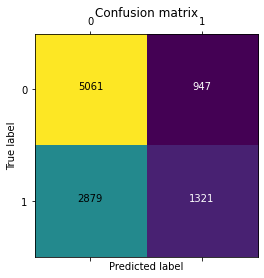

In [24]:
# plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.matshow(cm)
plt.title('Confusion matrix')
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
            horizontalalignment="center",
            color="white" if cm[i, j] < thresh else "black")
plt.ylabel('True label')
plt.xlabel('Predicted label');

In [8]:
# now repeat for the baseline model
baseline_model_name='A2-training-job-2021-05-30-07-20-10'
baseline_model_uri="s3://{}/{}/output/{}/output/model.tar.gz".format(bucket, prefix, baseline_model_name)
endpoint_name = baseline_model_name + '-ep'

# if using a trained predictor in the same notebook session
#baseline_model_predictor = tf_estimator.deploy(
#    initial_instance_count=1,
#    instance_type='ml.m4.xlarge',
#    endpoint_name=endpoint_name)

# if using a previously-saved model artifact
baseline_model = TensorFlowModel(
    model_data=baseline_model_uri,
    role=role,
    framework_version='2.1.0')

baseline_model_predictor = baseline_model.deploy(
    initial_instance_count=1,
    instance_type='ml.m4.xlarge',
    endpoint_name=endpoint_name)

update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


-------------!

In [25]:
# make predictions
predictions = np.array(baseline_model_predictor.predict(X_test)["predictions"])
y_pred = np.where(predictions > 0.5, 1, 0)

In [26]:
# calculate metrics
accuracy_metric = accuracy_score(y_test, y_pred)
precision_metric = precision_score(y_test, y_pred)
recall_metric = recall_score(y_test, y_pred)
auc_metric = roc_auc_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, predictions)
auprc_metric = auc(recall, precision)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
specificity_metric = tn/(tn+fp)
balanced_accuracy_metric = balanced_accuracy_score(y_test, y_pred)
f1_metric = f1_score(y_test, y_pred)

print("Accuracy: {}".format(round(accuracy_metric,4)))
print("Precision: {}".format(round(precision_metric,4)))
print("Recall: {}".format(round(recall_metric,4)))
print("AUC: {}".format(round(auc_metric,4)))
print("AUPRC: {}".format(round(auprc_metric,4)))

print("Specificity: {}".format(round(specificity_metric,4)))
print("Balanced accuracy: {}".format(round(balanced_accuracy_metric,4)))
print("F1 score: {}".format(round(f1_metric,4)))

Accuracy: 0.6211
Precision: 0.5633
Recall: 0.3517
AUC: 0.5805
AUPRC: 0.552
Specificity: 0.8094
Balanced accuracy: 0.5805
F1 score: 0.433


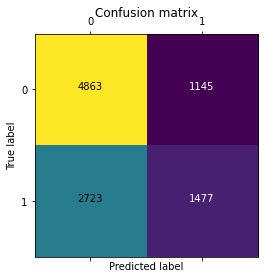

In [27]:
# plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.matshow(cm)
plt.title('Confusion matrix')
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
            horizontalalignment="center",
            color="white" if cm[i, j] < thresh else "black")
plt.ylabel('True label')
plt.xlabel('Predicted label');

In [28]:
# to avoid incurring unexpected extra charges on the account, delete the endpoints
best_model_predictor.delete_endpoint()
baseline_model_predictor.delete_endpoint()